# AUTHOR:Nagashree

# Breast Cancer Wisconsin (Diagnostic) Data Set

# Predict whether the cancer is benign or malignant

# "Attribute Information:"

1) 'ID number 2) Diagnosis (M = malignant, B = benign) 3-32)'

Ten real-valued features are computed for each cell nucleus:

a) radius (mean of distances from center to points on the perimeter) b) texture (standard deviation of gray-scale values) c) perimeter d) area e) smoothness (local variation in radius lengths) f) compactness (perimeter^2 / area - 1.0) g) concavity (severity of concave portions of the contour) h) concave points (number of concave portions of the contour) i) symmetry j) fractal dimension ("coastline approximation" - 1)

The mean, standard error and "worst" or largest (mean of the three largest values) of these features were computed for each image, resulting in 30 features. For instance, field 3 is Mean Radius, field 13 is Radius SE, field 23 is Worst Radius.

All feature values are recoded with four significant digits.

Missing attribute values: none

Class distribution: 357 benign, 212 malignant

In [ ]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns 

import warnings
warnings.filterwarnings("ignore")

# Exploratory Data Analysis(EDA)

In [73]:
pd.options.display.float_format = '{:,.2f}'.format

pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

In [74]:
df = pd.read_csv(r'C:\Users\pc\Desktop\Data.csv')
df.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,"1,001.00",0.12,0.28,0.30,0.15,0.24,0.08,1.09,0.91,8.59,153.40,0.01,0.05,0.05,0.02,0.03,0.01,25.38,17.33,184.60,"2,019.00",0.16,0.67,0.71,0.27,0.46,0.12,nan
1,842517,M,20.57,17.77,132.90,"1,326.00",0.08,0.08,0.09,0.07,0.18,0.06,0.54,0.73,3.40,74.08,0.01,0.01,0.02,0.01,0.01,0.00,24.99,23.41,158.80,"1,956.00",0.12,0.19,0.24,0.19,0.28,0.09,nan
2,84300903,M,19.69,21.25,130.00,"1,203.00",0.11,0.16,0.20,0.13,0.21,0.06,0.75,0.79,4.58,94.03,0.01,0.04,0.04,0.02,0.02,0.00,23.57,25.53,152.50,"1,709.00",0.14,0.42,0.45,0.24,0.36,0.09,nan
3,84348301,M,11.42,20.38,77.58,386.10,0.14,0.28,0.24,0.11,0.26,0.10,0.50,1.16,3.44,27.23,0.01,0.07,0.06,0.02,0.06,0.01,14.91,26.50,98.87,567.70,0.21,0.87,0.69,0.26,0.66,0.17,nan
4,84358402,M,20.29,14.34,135.10,"1,297.00",0.10,0.13,0.20,0.10,0.18,0.06,0.76,0.78,5.44,94.44,0.01,0.02,0.06,0.02,0.02,0.01,22.54,16.67,152.20,"1,575.00",0.14,0.20,0.40,0.16,0.24,0.08,nan


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 33 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             5

In [75]:
df.describe()

,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
count,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,0.00
mean,"30,371,831.43",14.13,19.29,91.97,654.89,0.10,0.10,0.09,0.05,0.18,0.06,0.41,1.22,2.87,40.34,0.01,0.03,0.03,0.01,0.02,0.00,16.27,25.68,107.26,880.58,0.13,0.25,0.27,0.11,0.29,0.08,nan
std,"125,020,585.61",3.52,4.30,24.30,351.91,0.01,0.05,0.08,0.04,0.03,0.01,0.28,0.55,2.02,45.49,0.00,0.02,0.03,0.01,0.01,0.00,4.83,6.15,33.60,569.36,0.02,0.16,0.21,0.07,0.06,0.02,nan
min,"8,670.00",6.98,9.71,43.79,143.50,0.05,0.02,0.00,0.00,0.11,0.05,0.11,0.36,0.76,6.80,0.00,0.00,0.00,0.00,0.01,0.00,7.93,12.02,50.41,185.20,0.07,0.03,0.00,0.00,0.16,0.06,nan
25%,"869,218.00",11.70,16.17,75.17,420.30,0.09,0.06,0.03,0.02,0.16,0.06,0.23,0.83,1.61,17.85,0.01,0.01,0.02,0.01,0.02,0.00,13.01,21.08,84.11,515.30,0.12,0.15,0.11,0.06,0.25,0.07,nan
50%,"906,024.00",13.37,18.84,86.24,551.10,0.10,0.09,0.06,0.03,0.18,0.06,0.32,1.11,2.29,24.53,0.01,0.02,0.03,0.01,0.02,0.00,14.97,25.41,97.66,686.50,0.13,0.21,0.23,0.10,0.28,0.08,nan
75%,"8,813,129.00",15.78,21.80,104.10,782.70,0.11,0.13,0.13,0.07,0.20,0.07,0.48,1.47,3.36,45.19,0.01,0.03,0.04,0.01,0.02,0.00,18.79,29.72,125.40,"1,084.00",0.15,0.34,0.38,0.16,0.32,0.09,nan
max,"911,320,502.00",28.11,39.28,188.50,"2,501.00",0.16,0.35,0.43,0.20,0.30,0.10,2.87,4.88,21.98,542.20,0.03,0.14,0.40,0.05,0.08,0.03,36.04,49.54,251.20,"4,254.00",0.22,1.06,1.25,0.29,0.66,0.21,nan


In [76]:
df.corr()

,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
id,1.00,0.07,0.10,0.07,0.10,-0.01,0.00,0.05,0.04,-0.02,-0.05,0.14,-0.01,0.14,0.18,0.10,0.03,0.06,0.08,-0.02,0.03,0.08,0.06,0.08,0.11,0.01,-0.00,0.02,0.04,-0.04,-0.03,nan
radius_mean,0.07,1.00,0.32,1.00,0.99,0.17,0.51,0.68,0.82,0.15,-0.31,0.68,-0.10,0.67,0.74,-0.22,0.21,0.19,0.38,-0.10,-0.04,0.97,0.30,0.97,0.94,0.12,0.41,0.53,0.74,0.16,0.01,nan
texture_mean,0.10,0.32,1.00,0.33,0.32,-0.02,0.24,0.30,0.29,0.07,-0.08,0.28,0.39,0.28,0.26,0.01,0.19,0.14,0.16,0.01,0.05,0.35,0.91,0.36,0.34,0.08,0.28,0.30,0.30,0.11,0.12,nan
perimeter_mean,0.07,1.00,0.33,1.00,0.99,0.21,0.56,0.72,0.85,0.18,-0.26,0.69,-0.09,0.69,0.74,-0.20,0.25,0.23,0.41,-0.08,-0.01,0.97,0.30,0.97,0.94,0.15,0.46,0.56,0.77,0.19,0.05,nan
area_mean,0.10,0.99,0.32,0.99,1.00,0.18,0.50,0.69,0.82,0.15,-0.28,0.73,-0.07,0.73,0.80,-0.17,0.21,0.21,0.37,-0.07,-0.02,0.96,0.29,0.96,0.96,0.12,0.39,0.51,0.72,0.14,0.00,nan
smoothness_mean,-0.01,0.17,-0.02,0.21,0.18,1.00,0.66,0.52,0.55,0.56,0.58,0.30,0.07,0.30,0.25,0.33,0.32,0.25,0.38,0.20,0.28,0.21,0.04,0.24,0.21,0.81,0.47,0.43,0.50,0.39,0.50,nan
compactness_mean,0.00,0.51,0.24,0.56,0.50,0.66,1.00,0.88,0.83,0.60,0.57,0.50,0.05,0.55,0.46,0.14,0.74,0.57,0.64,0.23,0.51,0.54,0.25,0.59,0.51,0.57,0.87,0.82,0.82,0.51,0.69,nan
concavity_mean,0.05,0.68,0.30,0.72,0.69,0.52,0.88,1.00,0.92,0.50,0.34,0.63,0.08,0.66,0.62,0.10,0.67,0.69,0.68,0.18,0.45,0.69,0.30,0.73,0.68,0.45,0.75,0.88,0.86,0.41,0.51,nan
concave points_mean,0.04,0.82,0.29,0.85,0.82,0.55,0.83,0.92,1.00,0.46,0.17,0.70,0.02,0.71,0.69,0.03,0.49,0.44,0.62,0.10,0.26,0.83,0.29,0.86,0.81,0.45,0.67,0.75,0.91,0.38,0.37,nan
symmetry_mean,-0.02,0.15,0.07,0.18,0.15,0.56,0.60,0.50,0.46,1.00,0.48,0.30,0.13,0.31,0.22,0.19,0.42,0.34,0.39,0.45,0.33,0.19,0.09,0.22,0.18,0.43,0.47,0.43,0.43,0.70,0.44,nan


Number of Benign:  357
Number of Malignant :  212


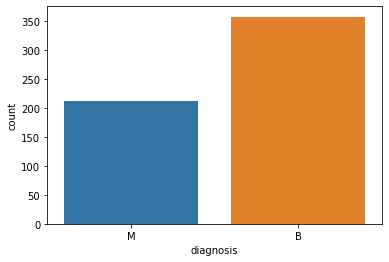

In [77]:
ax = sns.countplot(df.diagnosis,label="Count") 
B, M = df.diagnosis.value_counts()
print('Number of Benign: ',B)
print('Number of Malignant : ',M)

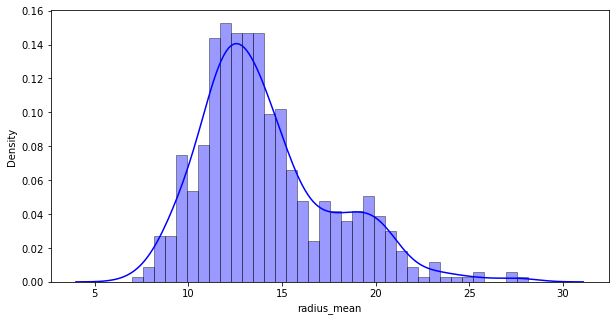

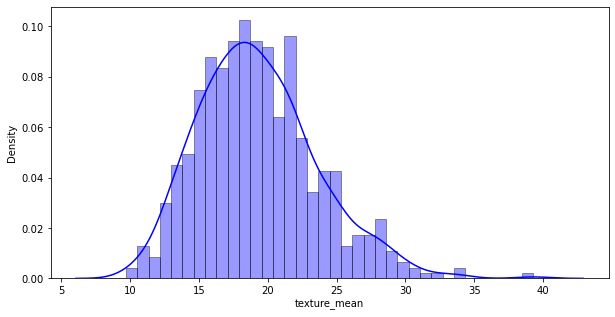

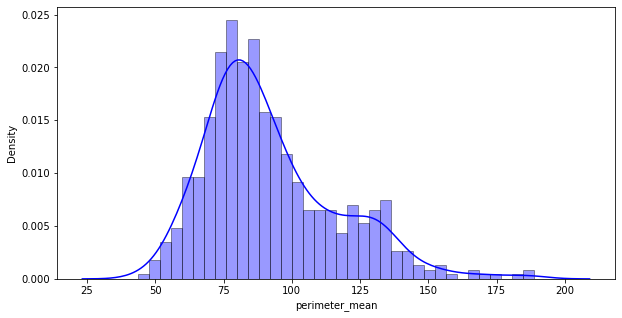

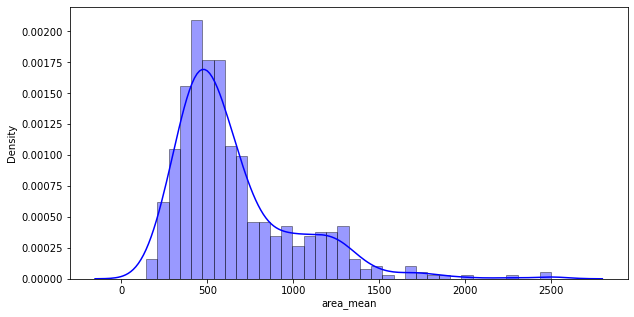

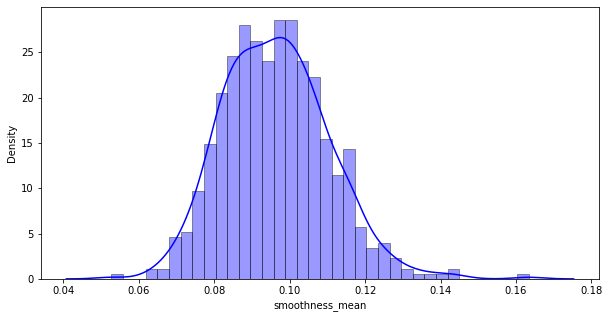

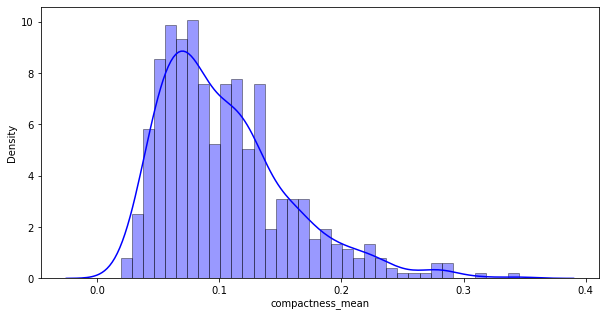

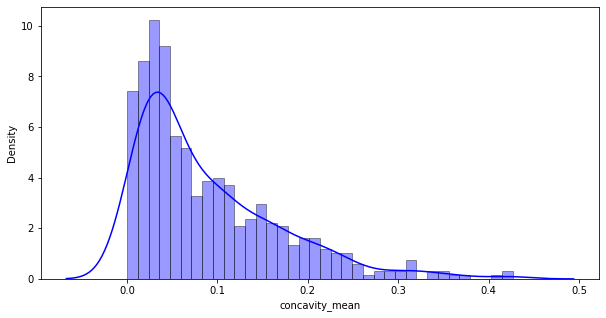

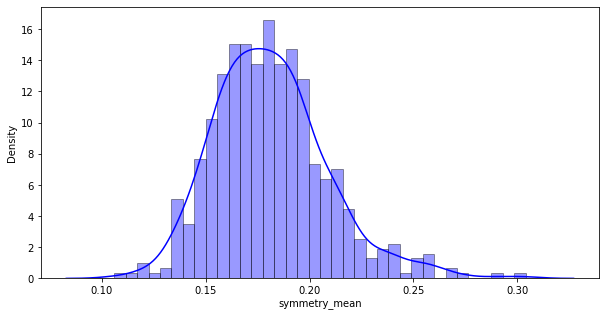

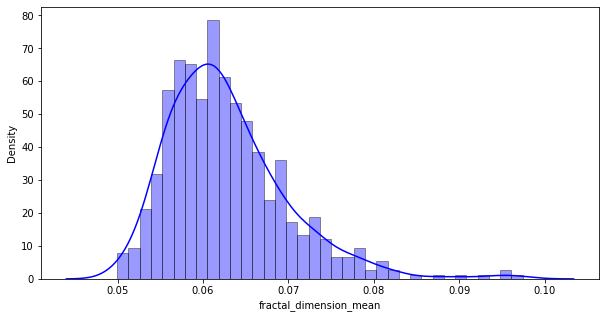

In [8]:
mean_features = ["radius_mean", "texture_mean", "perimeter_mean", "area_mean", "smoothness_mean", "compactness_mean", "concavity_mean", 
                 "symmetry_mean", "fractal_dimension_mean"]

for column in mean_features:
    plt.figure(figsize = (10,5))
    feature = df[column]
    sns.distplot(feature, hist=True, kde=True, 
                    bins=int(180/5), color = 'blue',
                 
                 
                 
                     hist_kws={'edgecolor':'black'})

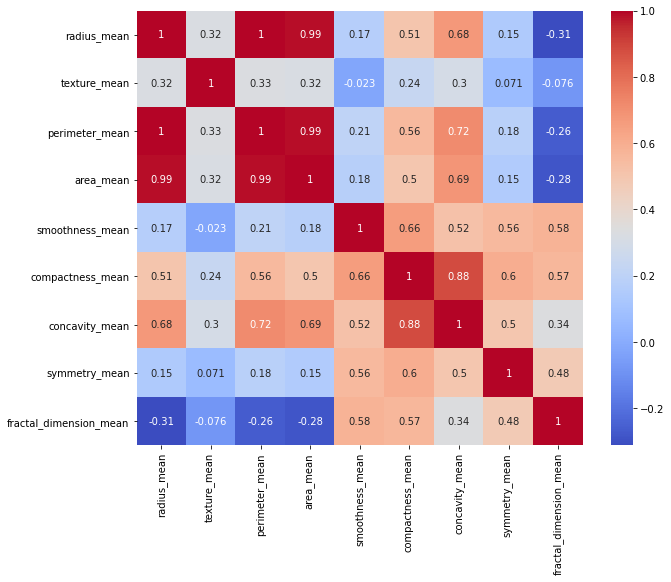

In [78]:
plt.subplots(figsize=(10,8))
sns.heatmap(df[mean_features].corr(),cmap='coolwarm',annot=True);

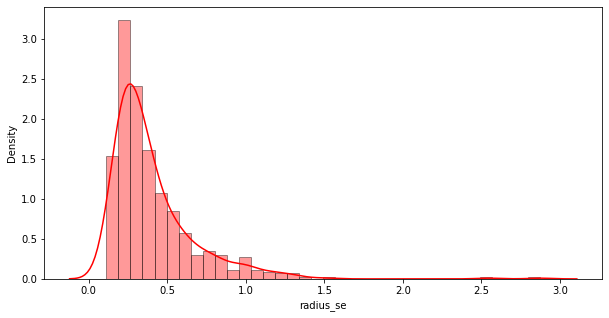

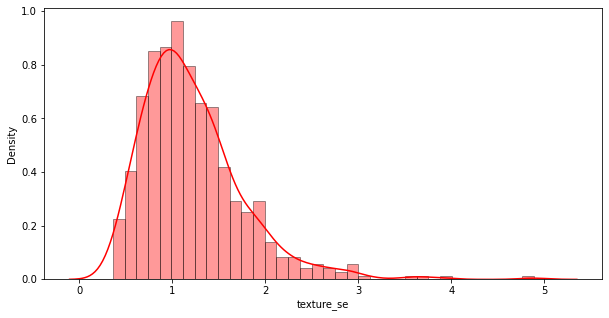

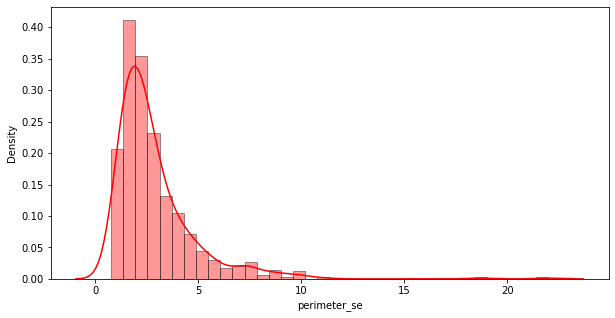

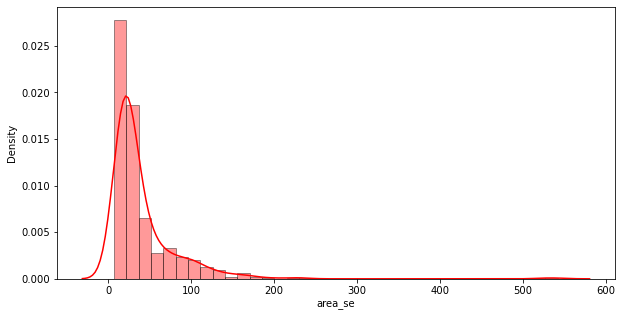

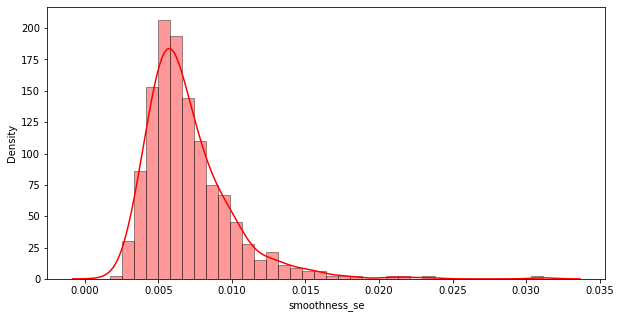

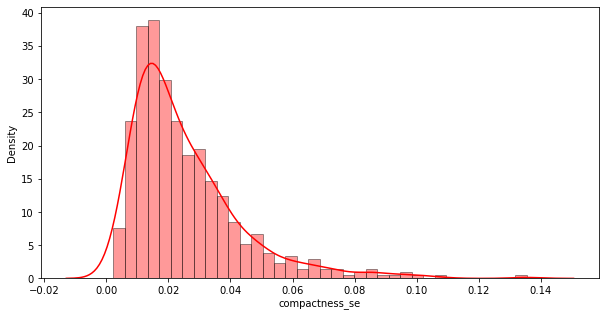

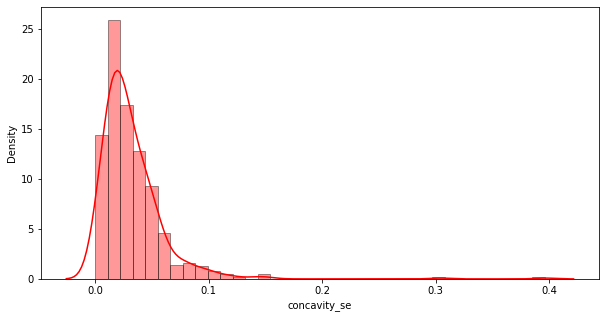

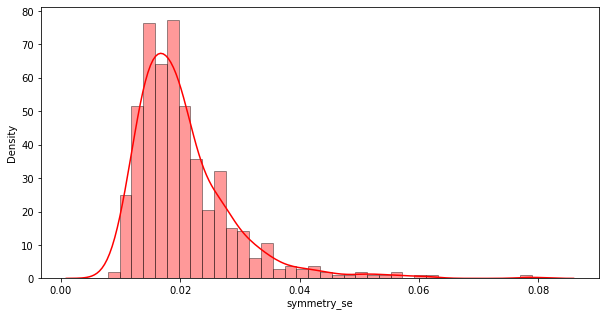

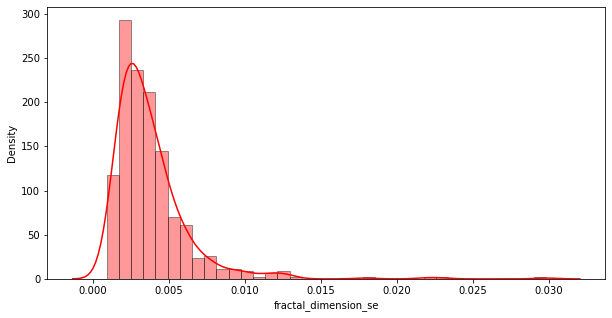

In [10]:
se_features = ["radius_se", "texture_se", "perimeter_se", "area_se", "smoothness_se", "compactness_se", "concavity_se", 
                 "symmetry_se", "fractal_dimension_se"]

for column in se_features:
    plt.figure(figsize = (10,5))
    feature = df[column]
    sns.distplot(feature, hist=True, kde=True, 
                    bins=int(180/5), color = 'red',
                     hist_kws={'edgecolor':'black'})

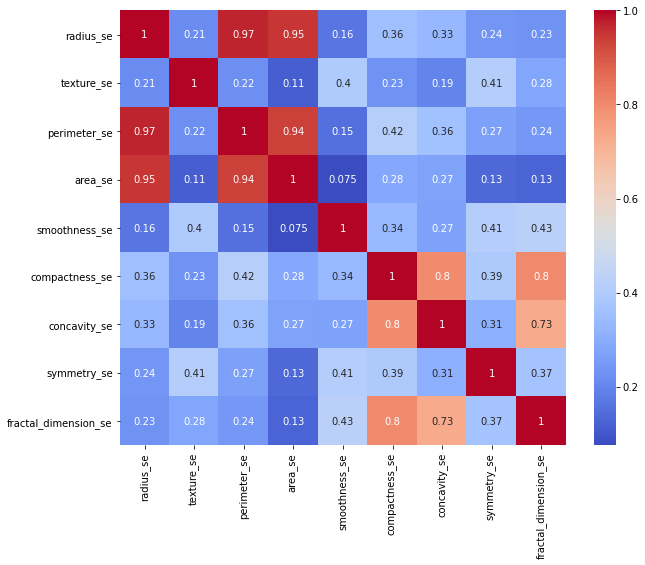

In [11]:
plt.subplots(figsize=(10,8))
sns.heatmap(df[se_features].corr(),cmap='coolwarm',annot=True);

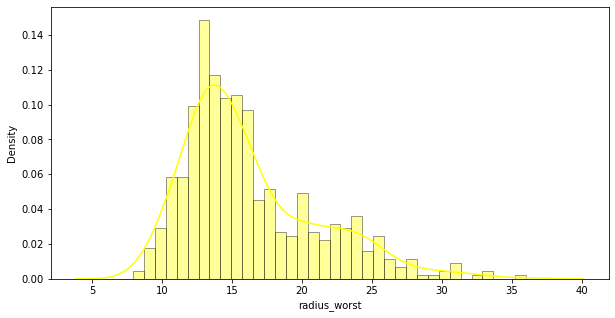

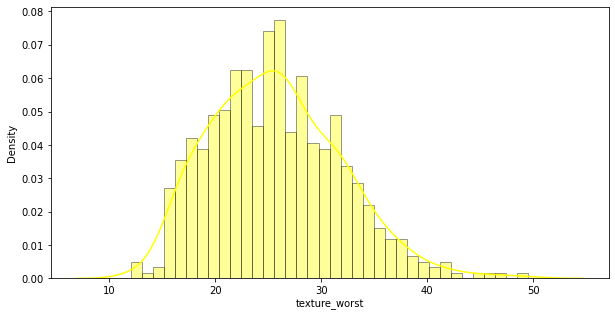

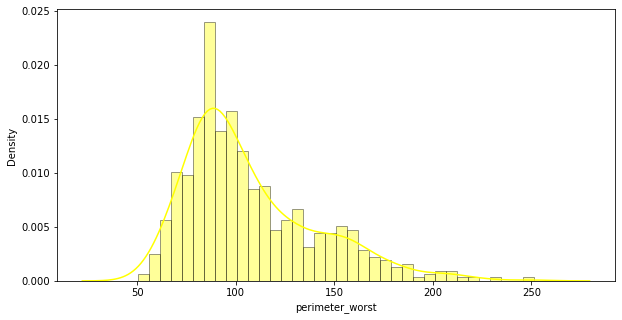

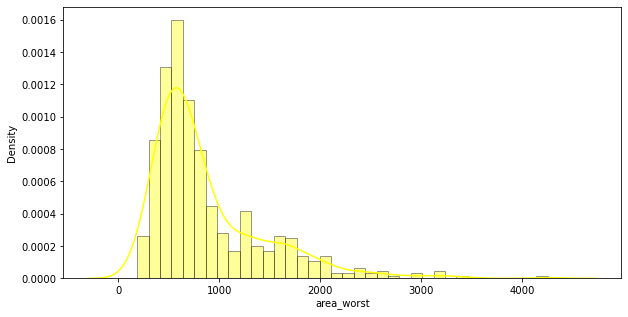

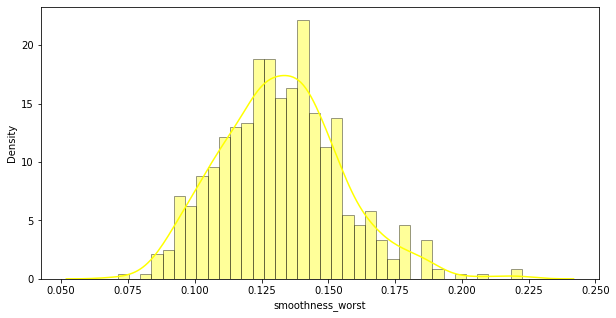

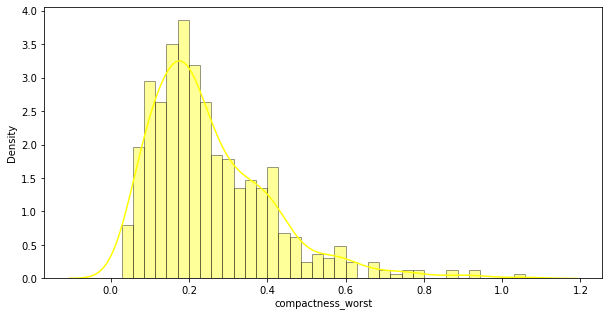

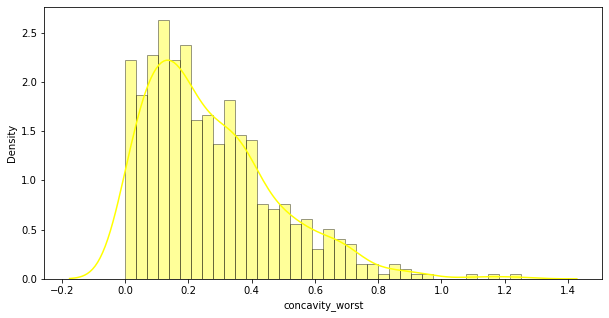

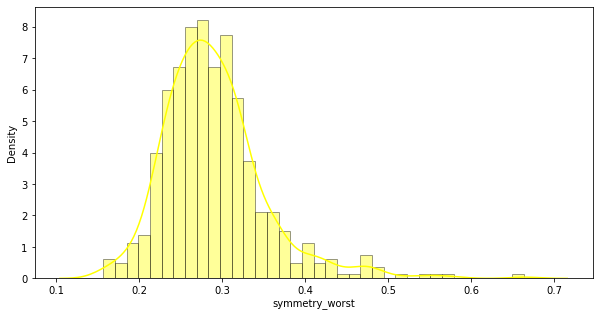

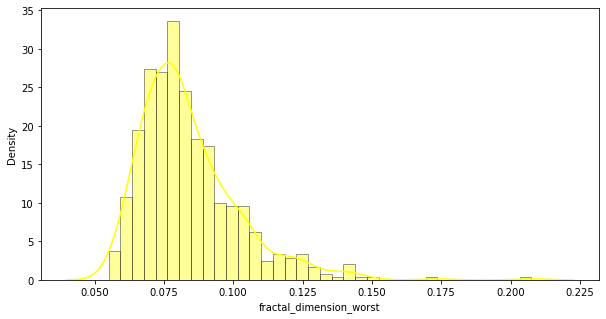

In [12]:
worst_features = ["radius_worst", "texture_worst", "perimeter_worst", "area_worst", "smoothness_worst", "compactness_worst", "concavity_worst", 
                 "symmetry_worst", "fractal_dimension_worst"]

for column in worst_features:
    plt.figure(figsize = (10,5))
    feature = df[column]
    sns.distplot(feature, hist=True, kde=True, 
                    bins=int(180/5), color = 'yellow',
                     hist_kws={'edgecolor':'black'});

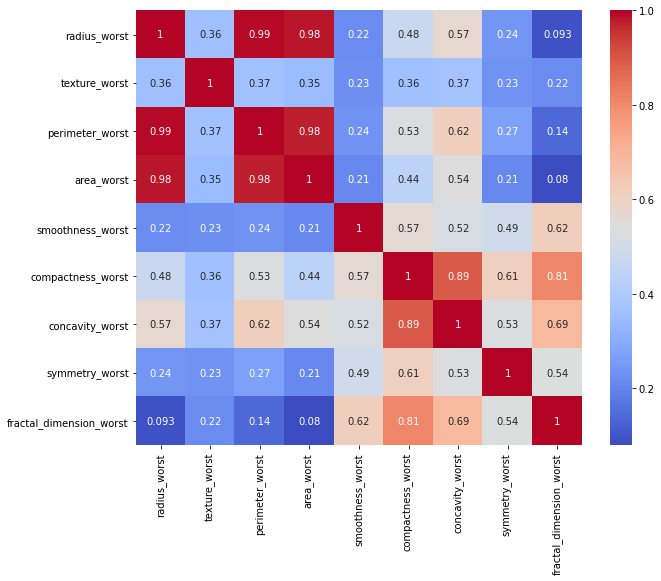

In [13]:
plt.subplots(figsize=(10,8))
sns.heatmap(df[worst_features].corr(),cmap='coolwarm',annot=True);

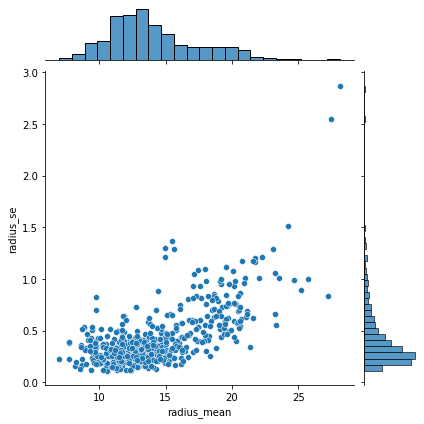

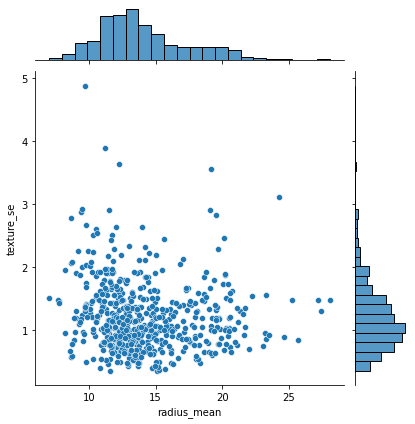

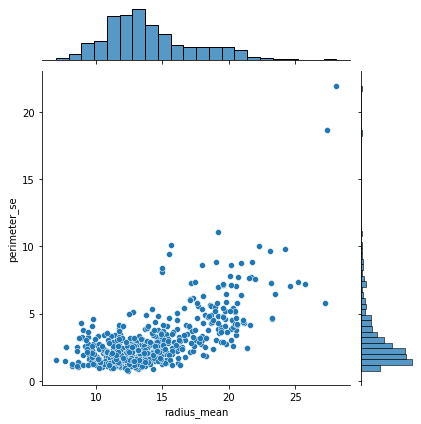

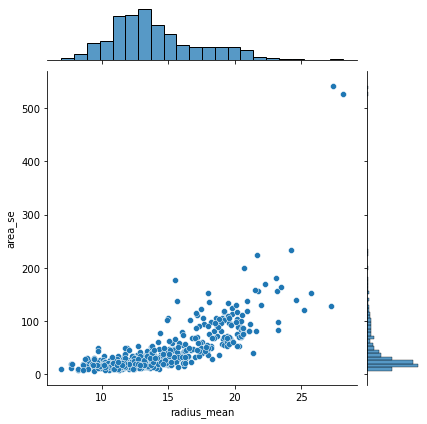

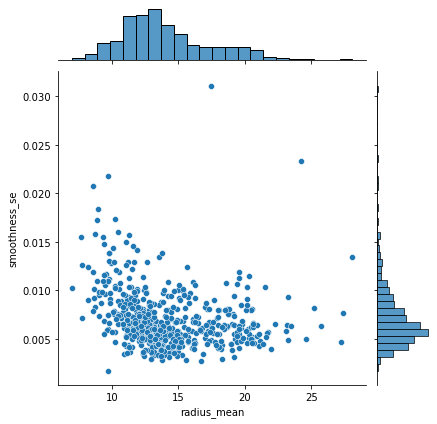

...

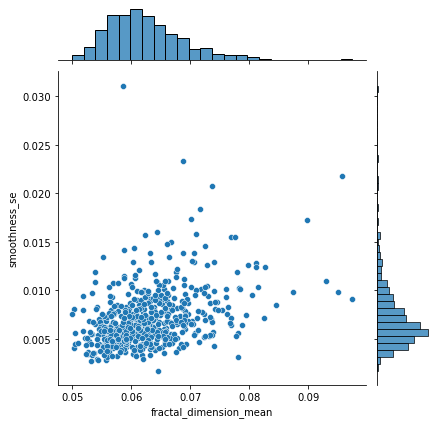

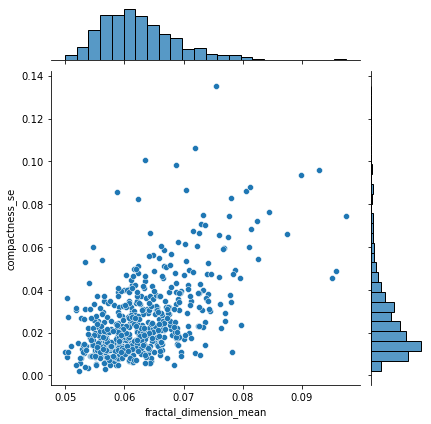

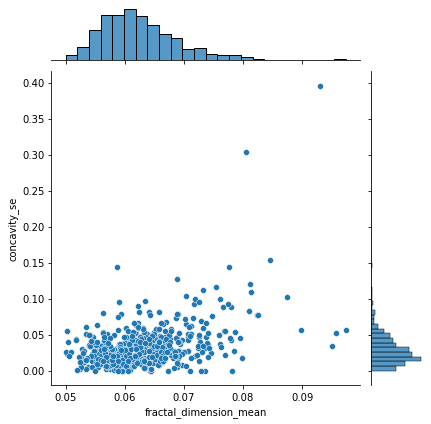

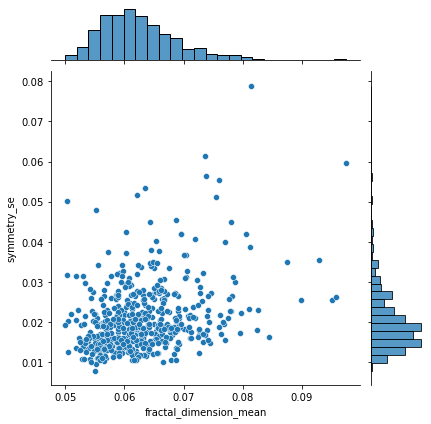

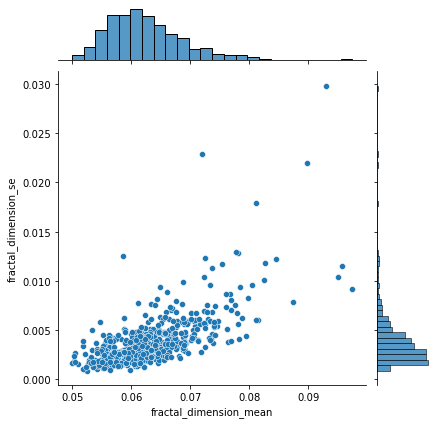

In [14]:
for x_column in mean_features:
    for y_cloumn in se_features:
        sns.jointplot(x= x_column,y=y_cloumn,data=df,kind='scatter');

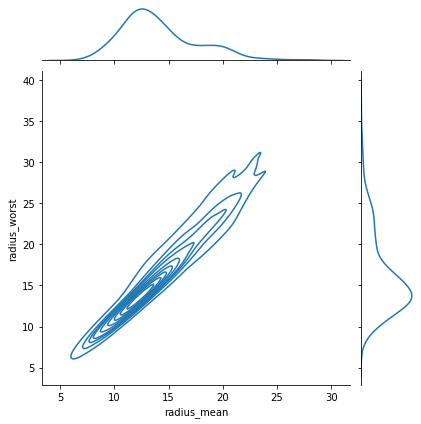

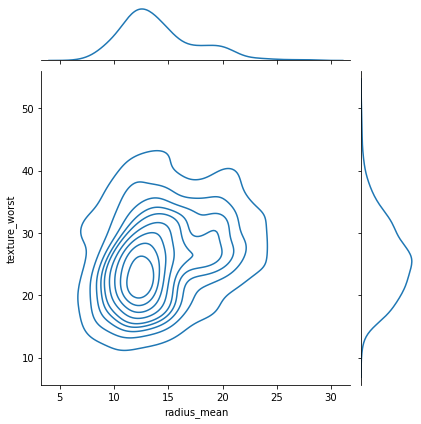

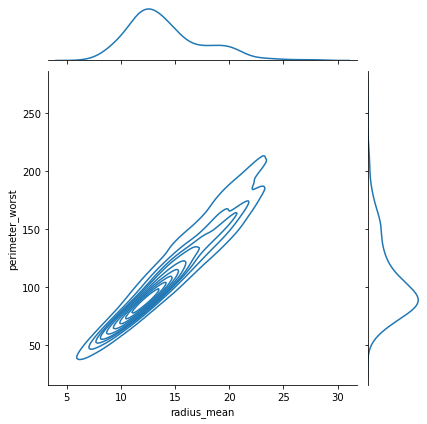

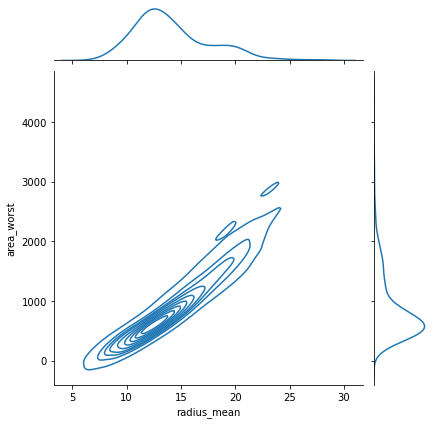

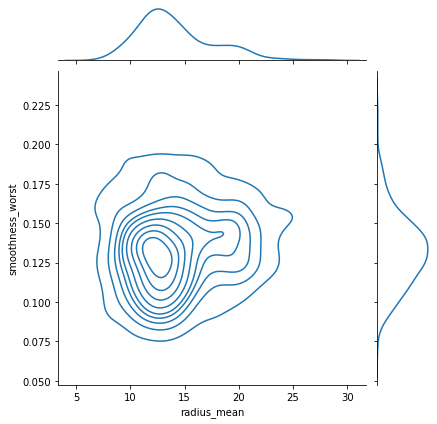

...

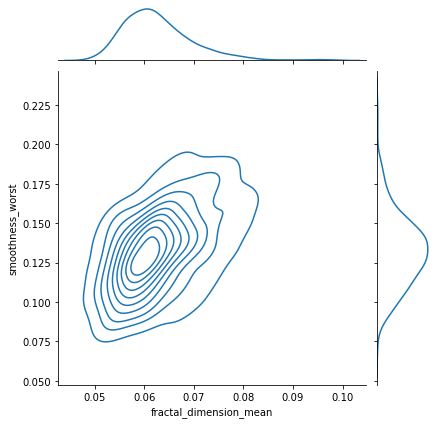

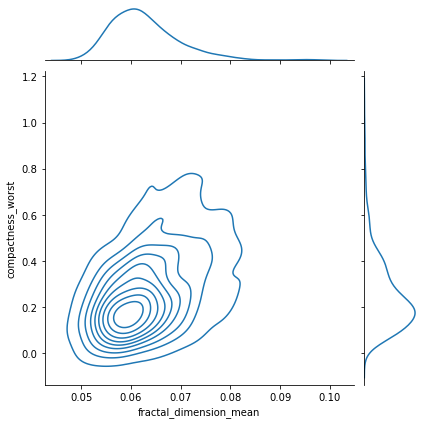

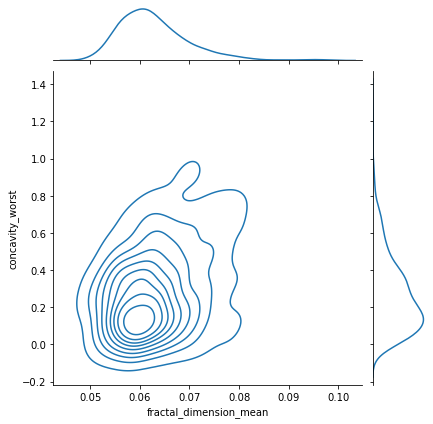

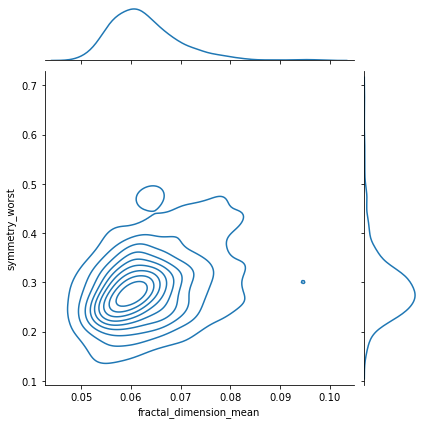

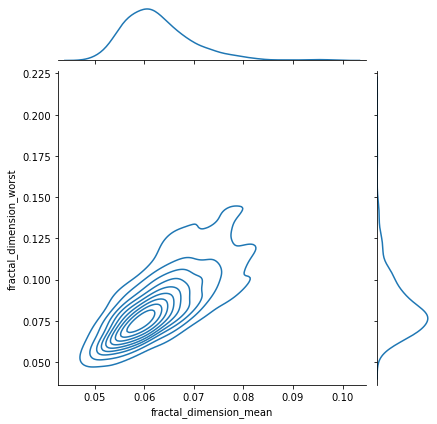

In [15]:
for x_column in mean_features:
    for y_cloumn in worst_features:
        sns.jointplot(x= x_column,y=y_cloumn,data=df,kind='kde');

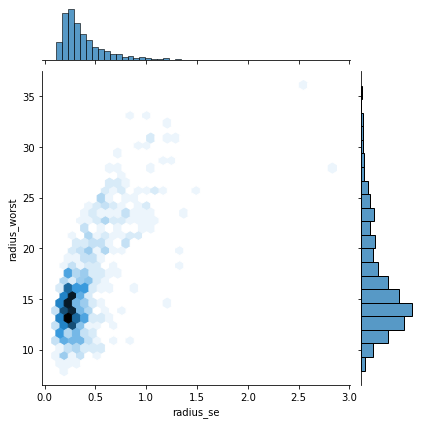

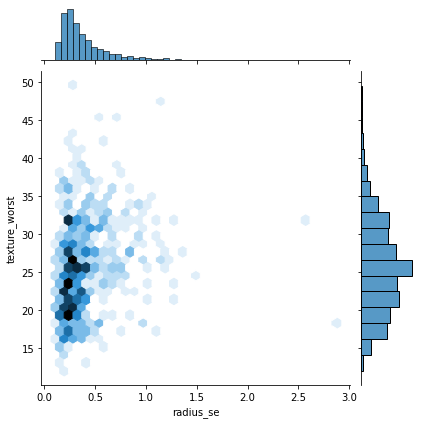

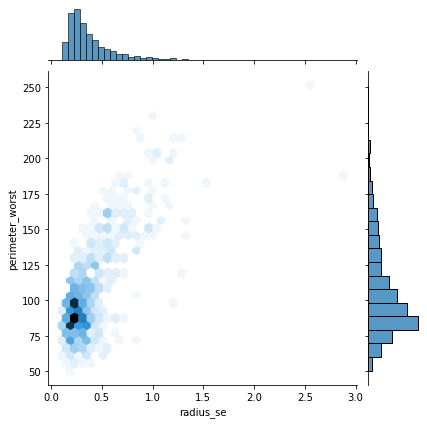

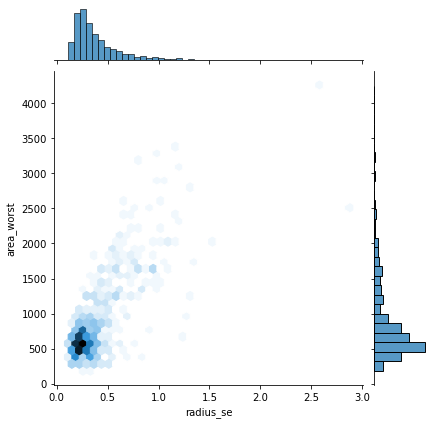

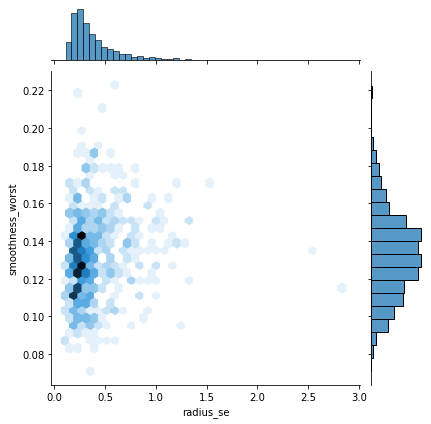

...

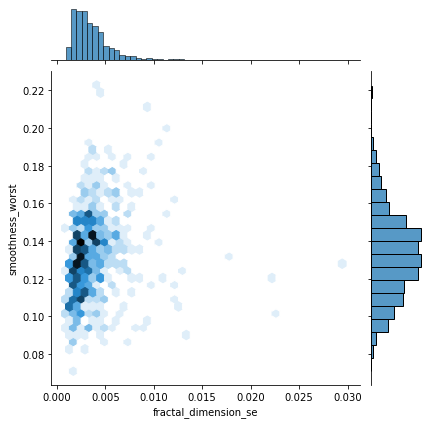

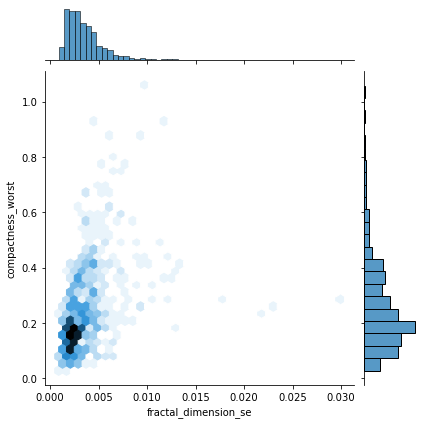

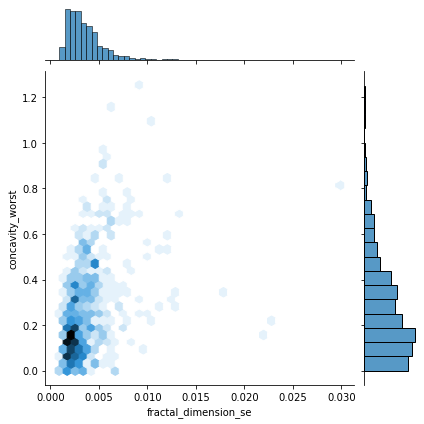

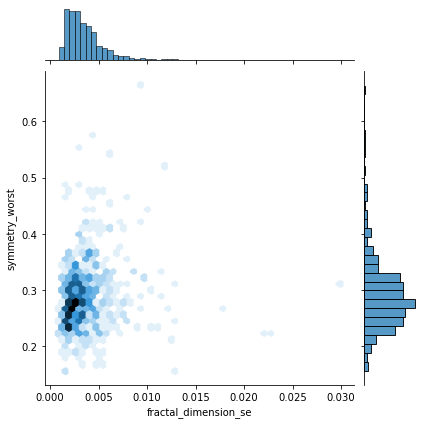

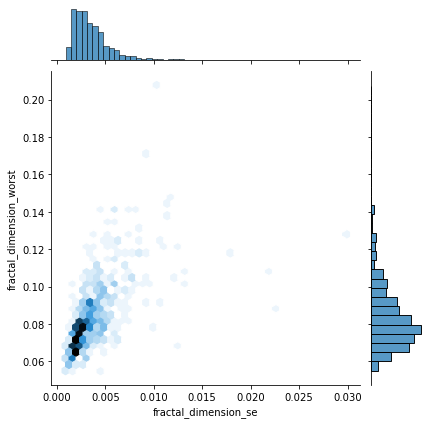

In [16]:
for x_column in se_features:
    for y_cloumn in worst_features:
        sns.jointplot(x= x_column,y=y_cloumn,data=df,kind='hex');

In [19]:
y = df.diagnosis 
x = df.drop('diagnosis', axis = 1)

Number of Benign:  357
Number of Malignant :  212


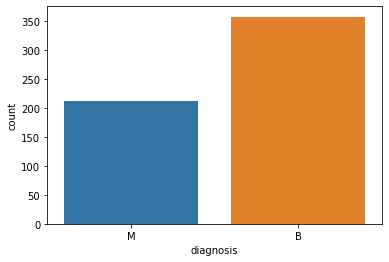

In [23]:
ax = sns.countplot(y,label="Count") 
B, M = y.value_counts()
print('Number of Benign: ',B)
print('Number of Malignant : ',M)

In [26]:
x.describe()

,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
count,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,0.00
mean,"30,371,831.43",14.13,19.29,91.97,654.89,0.10,0.10,0.09,0.05,0.18,0.06,0.41,1.22,2.87,40.34,0.01,0.03,0.03,0.01,0.02,0.00,16.27,25.68,107.26,880.58,0.13,0.25,0.27,0.11,0.29,0.08,nan
std,"125,020,585.61",3.52,4.30,24.30,351.91,0.01,0.05,0.08,0.04,0.03,0.01,0.28,0.55,2.02,45.49,0.00,0.02,0.03,0.01,0.01,0.00,4.83,6.15,33.60,569.36,0.02,0.16,0.21,0.07,0.06,0.02,nan
min,"8,670.00",6.98,9.71,43.79,143.50,0.05,0.02,0.00,0.00,0.11,0.05,0.11,0.36,0.76,6.80,0.00,0.00,0.00,0.00,0.01,0.00,7.93,12.02,50.41,185.20,0.07,0.03,0.00,0.00,0.16,0.06,nan
25%,"869,218.00",11.70,16.17,75.17,420.30,0.09,0.06,0.03,0.02,0.16,0.06,0.23,0.83,1.61,17.85,0.01,0.01,0.02,0.01,0.02,0.00,13.01,21.08,84.11,515.30,0.12,0.15,0.11,0.06,0.25,0.07,nan
50%,"906,024.00",13.37,18.84,86.24,551.10,0.10,0.09,0.06,0.03,0.18,0.06,0.32,1.11,2.29,24.53,0.01,0.02,0.03,0.01,0.02,0.00,14.97,25.41,97.66,686.50,0.13,0.21,0.23,0.10,0.28,0.08,nan
75%,"8,813,129.00",15.78,21.80,104.10,782.70,0.11,0.13,0.13,0.07,0.20,0.07,0.48,1.47,3.36,45.19,0.01,0.03,0.04,0.01,0.02,0.00,18.79,29.72,125.40,"1,084.00",0.15,0.34,0.38,0.16,0.32,0.09,nan
max,"911,320,502.00",28.11,39.28,188.50,"2,501.00",0.16,0.35,0.43,0.20,0.30,0.10,2.87,4.88,21.98,542.20,0.03,0.14,0.40,0.05,0.08,0.03,36.04,49.54,251.20,"4,254.00",0.22,1.06,1.25,0.29,0.66,0.21,nan


In [30]:
y = df.diagnosis.values
x_df = df.drop(["diagnosis"],axis=1)

In [31]:
# X Dataframe should be normalized to avoid dominance among numerical values because it has several features and 
#model success becomes more realistic if numbers are drawn between 0-1.

x = (x_df - np.min(x_df))/(np.max(x_df)-np.min(x_df)).values           # Formula of normalization

# Train and Test Split

In [32]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x,y,test_size = 0.2,random_state=42)

In [33]:
print("x_train: ",x_train.shape)
print("x_test: ",x_test.shape)
print("y_train: ",y_train.shape)
print("y_test: ",y_test.shape)

x_train:  (455, 32)
x_test:  (114, 32)
y_train:  (455,)
y_test:  (114,)


In [35]:
# Transforming arrays to transpoze in order to avoid getting shape error
x_train = x_train.T
x_test = x_test.T
y_train = y_train.T
y_test = y_test.T

In [36]:
print("x_train: ",x_train.shape)
print("x_test: ",x_test.shape)
print("y_train: ",y_train.shape)
print("y_test: ",y_test.shape)

x_train:  (455, 32)
x_test:  (114, 32)
y_train:  (455,)
y_test:  (114,)


In [37]:
name_list = ['Logistic Regression', 'Knn(n=8)', 'SVM', 'Naive Bayes','Decision Tree', 'Random Foerest']
pred_score = []    # In order to compare all pred scores

# Logistic Regression with SKLearn

In [38]:
from sklearn.linear_model import LogisticRegression
lr = LogisticRegression()

# KNN Algorithm and Visualization

In [43]:
df = pd.read_csv(r'C:\Users\pc\Desktop\Data.csv', delimiter=',')
df.drop(["id","Unnamed: 32"],axis=1,inplace=True)

df.tail(10)   # Controlling last 10 rows

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
559,B,11.51,23.93,74.52,403.50,0.09,0.10,0.11,0.04,0.14,0.07,0.24,2.90,1.94,16.97,0.01,0.03,0.06,0.01,0.01,0.00,12.48,37.16,82.28,474.20,0.13,0.25,0.36,0.10,0.21,0.09
560,B,14.05,27.15,91.38,600.40,0.10,0.11,0.04,0.04,0.15,0.06,0.36,1.49,2.89,29.84,0.01,0.03,0.02,0.02,0.02,0.01,15.30,33.17,100.20,706.70,0.12,0.23,0.13,0.10,0.23,0.08
561,B,11.20,29.37,70.67,386.00,0.07,0.04,0.00,0.00,0.11,0.06,0.31,3.90,2.04,22.81,0.01,0.01,0.00,0.00,0.02,0.00,11.92,38.30,75.19,439.60,0.09,0.05,0.00,0.00,0.16,0.06
562,M,15.22,30.62,103.40,716.90,0.10,0.21,0.26,0.09,0.21,0.07,0.26,1.21,2.36,22.65,0.00,0.05,0.07,0.02,0.02,0.01,17.52,42.79,128.70,915.00,0.14,0.79,1.17,0.24,0.41,0.14
563,M,20.92,25.09,143.00,"1,347.00",0.11,0.22,0.32,0.15,0.21,0.07,0.96,1.03,8.76,118.80,0.01,0.04,0.08,0.03,0.02,0.01,24.29,29.41,179.10,"1,819.00",0.14,0.42,0.66,0.25,0.29,0.10
564,M,21.56,22.39,142.00,"1,479.00",0.11,0.12,0.24,0.14,0.17,0.06,1.18,1.26,7.67,158.70,0.01,0.03,0.05,0.02,0.01,0.00,25.45,26.40,166.10,"2,027.00",0.14,0.21,0.41,0.22,0.21,0.07
565,M,20.13,28.25,131.20,"1,261.00",0.10,0.10,0.14,0.10,0.18,0.06,0.77,2.46,5.20,99.04,0.01,0.02,0.04,0.02,0.02,0.00,23.69,38.25,155.00,"1,731.00",0.12,0.19,0.32,0.16,0.26,0.07
566,M,16.60,28.08,108.30,858.10,0.08,0.10,0.09,0.05,0.16,0.06,0.46,1.07,3.42,48.55,0.01,0.04,0.05,0.02,0.01,0.00,18.98,34.12,126.70,"1,124.00",0.11,0.31,0.34,0.14,0.22,0.08
567,M,20.60,29.33,140.10,"1,265.00",0.12,0.28,0.35,0.15,0.24,0.07,0.73,1.59,5.77,86.22,0.01,0.06,0.07,0.02,0.02,0.01,25.74,39.42,184.60,"1,821.00",0.17,0.87,0.94,0.27,0.41,0.12
568,B,7.76,24.54,47.92,181.00,0.05,0.04,0.00,0.00,0.16,0.06,0.39,1.43,2.55,19.15,0.01,0.00,0.00,0.00,0.03,0.00,9.46,30.37,59.16,268.60,0.09,0.06,0.00,0.00,0.29,0.07


In [44]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 31 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   diagnosis                569 non-null    object 
 1   radius_mean              569 non-null    float64
 2   texture_mean             569 non-null    float64
 3   perimeter_mean           569 non-null    float64
 4   area_mean                569 non-null    float64
 5   smoothness_mean          569 non-null    float64
 6   compactness_mean         569 non-null    float64
 7   concavity_mean           569 non-null    float64
 8   concave points_mean      569 non-null    float64
 9   symmetry_mean            569 non-null    float64
 10  fractal_dimension_mean   569 non-null    float64
 11  radius_se                569 non-null    float64
 12  texture_se               569 non-null    float64
 13  perimeter_se             569 non-null    float64
 14  area_se                  5

In [45]:
df.describe()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
count,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00
mean,14.13,19.29,91.97,654.89,0.10,0.10,0.09,0.05,0.18,0.06,0.41,1.22,2.87,40.34,0.01,0.03,0.03,0.01,0.02,0.00,16.27,25.68,107.26,880.58,0.13,0.25,0.27,0.11,0.29,0.08
std,3.52,4.30,24.30,351.91,0.01,0.05,0.08,0.04,0.03,0.01,0.28,0.55,2.02,45.49,0.00,0.02,0.03,0.01,0.01,0.00,4.83,6.15,33.60,569.36,0.02,0.16,0.21,0.07,0.06,0.02
min,6.98,9.71,43.79,143.50,0.05,0.02,0.00,0.00,0.11,0.05,0.11,0.36,0.76,6.80,0.00,0.00,0.00,0.00,0.01,0.00,7.93,12.02,50.41,185.20,0.07,0.03,0.00,0.00,0.16,0.06
25%,11.70,16.17,75.17,420.30,0.09,0.06,0.03,0.02,0.16,0.06,0.23,0.83,1.61,17.85,0.01,0.01,0.02,0.01,0.02,0.00,13.01,21.08,84.11,515.30,0.12,0.15,0.11,0.06,0.25,0.07
50%,13.37,18.84,86.24,551.10,0.10,0.09,0.06,0.03,0.18,0.06,0.32,1.11,2.29,24.53,0.01,0.02,0.03,0.01,0.02,0.00,14.97,25.41,97.66,686.50,0.13,0.21,0.23,0.10,0.28,0.08
75%,15.78,21.80,104.10,782.70,0.11,0.13,0.13,0.07,0.20,0.07,0.48,1.47,3.36,45.19,0.01,0.03,0.04,0.01,0.02,0.00,18.79,29.72,125.40,"1,084.00",0.15,0.34,0.38,0.16,0.32,0.09
max,28.11,39.28,188.50,"2,501.00",0.16,0.35,0.43,0.20,0.30,0.10,2.87,4.88,21.98,542.20,0.03,0.14,0.40,0.05,0.08,0.03,36.04,49.54,251.20,"4,254.00",0.22,1.06,1.25,0.29,0.66,0.21


In [46]:
# Target Feature is diagnosis wthin M and B class

M = df[df.diagnosis == "M"]
B = df[df.diagnosis == "B"]

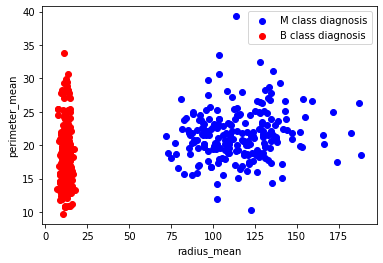

In [47]:
plt.scatter(M.perimeter_mean,M.texture_mean,color="blue",label="M class diagnosis")
plt.scatter(B.radius_mean,B.texture_mean,color="red",label="B class diagnosis")

plt.xlabel("radius_mean")
plt.ylabel("perimeter_mean")
plt.legend()

plt.show()

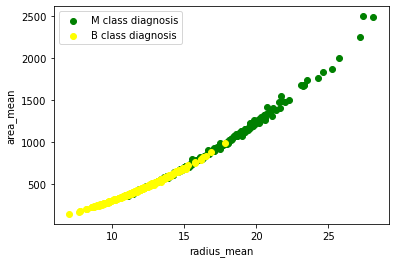

In [48]:
plt.scatter(M.radius_mean,M.area_mean,color="green",label="M class diagnosis")
plt.scatter(B.radius_mean,B.area_mean,color="yellow",label="B class diagnosis")

plt.xlabel("radius_mean")
plt.ylabel("area_mean")
plt.legend()

plt.show()

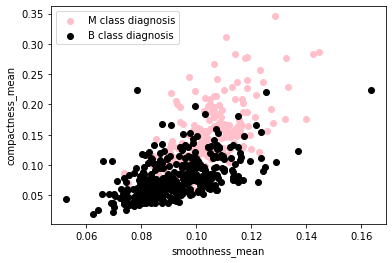

In [50]:
plt.scatter(M.smoothness_mean,M.compactness_mean,color="pink",label="M class diagnosis")
plt.scatter(B.smoothness_mean,B.compactness_mean,color="black",label="B class diagnosis")

plt.xlabel("smoothness_mean")
plt.ylabel("compactness_mean")
plt.legend()

plt.show()



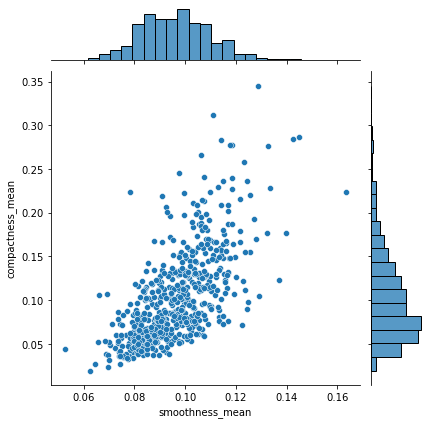

In [51]:
sns.jointplot(x='smoothness_mean',y='compactness_mean',data=df,kind='scatter');

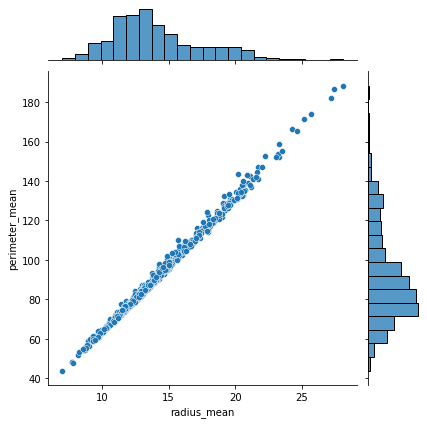

In [52]:
sns.jointplot(x='radius_mean',y='perimeter_mean',data=df,kind='scatter');

In [53]:
df.corr()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
radius_mean,1.00,0.32,1.00,0.99,0.17,0.51,0.68,0.82,0.15,-0.31,0.68,-0.10,0.67,0.74,-0.22,0.21,0.19,0.38,-0.10,-0.04,0.97,0.30,0.97,0.94,0.12,0.41,0.53,0.74,0.16,0.01
texture_mean,0.32,1.00,0.33,0.32,-0.02,0.24,0.30,0.29,0.07,-0.08,0.28,0.39,0.28,0.26,0.01,0.19,0.14,0.16,0.01,0.05,0.35,0.91,0.36,0.34,0.08,0.28,0.30,0.30,0.11,0.12
perimeter_mean,1.00,0.33,1.00,0.99,0.21,0.56,0.72,0.85,0.18,-0.26,0.69,-0.09,0.69,0.74,-0.20,0.25,0.23,0.41,-0.08,-0.01,0.97,0.30,0.97,0.94,0.15,0.46,0.56,0.77,0.19,0.05
area_mean,0.99,0.32,0.99,1.00,0.18,0.50,0.69,0.82,0.15,-0.28,0.73,-0.07,0.73,0.80,-0.17,0.21,0.21,0.37,-0.07,-0.02,0.96,0.29,0.96,0.96,0.12,0.39,0.51,0.72,0.14,0.00
smoothness_mean,0.17,-0.02,0.21,0.18,1.00,0.66,0.52,0.55,0.56,0.58,0.30,0.07,0.30,0.25,0.33,0.32,0.25,0.38,0.20,0.28,0.21,0.04,0.24,0.21,0.81,0.47,0.43,0.50,0.39,0.50
compactness_mean,0.51,0.24,0.56,0.50,0.66,1.00,0.88,0.83,0.60,0.57,0.50,0.05,0.55,0.46,0.14,0.74,0.57,0.64,0.23,0.51,0.54,0.25,0.59,0.51,0.57,0.87,0.82,0.82,0.51,0.69
concavity_mean,0.68,0.30,0.72,0.69,0.52,0.88,1.00,0.92,0.50,0.34,0.63,0.08,0.66,0.62,0.10,0.67,0.69,0.68,0.18,0.45,0.69,0.30,0.73,0.68,0.45,0.75,0.88,0.86,0.41,0.51
concave points_mean,0.82,0.29,0.85,0.82,0.55,0.83,0.92,1.00,0.46,0.17,0.70,0.02,0.71,0.69,0.03,0.49,0.44,0.62,0.10,0.26,0.83,0.29,0.86,0.81,0.45,0.67,0.75,0.91,0.38,0.37
symmetry_mean,0.15,0.07,0.18,0.15,0.56,0.60,0.50,0.46,1.00,0.48,0.30,0.13,0.31,0.22,0.19,0.42,0.34,0.39,0.45,0.33,0.19,0.09,0.22,0.18,0.43,0.47,0.43,0.43,0.70,0.44
fractal_dimension_mean,-0.31,-0.08,-0.26,-0.28,0.58,0.57,0.34,0.17,0.48,1.00,0.00,0.16,0.04,-0.09,0.40,0.56,0.45,0.34,0.35,0.69,-0.25,-0.05,-0.21,-0.23,0.50,0.46,0.35,0.18,0.33,0.77


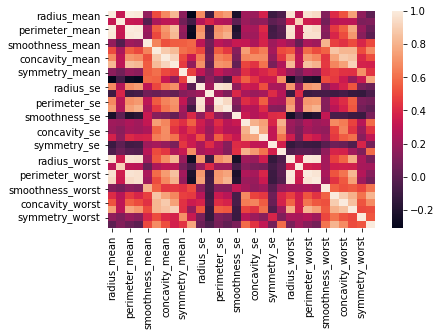

In [54]:
sns.heatmap(df.corr());

In [55]:
# We assign 1 value if diagnosis is M and we assing 0 value if diagnosis is B  

df.diagnosis = [1 if each == "M" else 0 for each in df.diagnosis]

y = df.diagnosis.values
x_df = df.drop(["diagnosis"],axis=1)

In [56]:
# normalization 
x = (x_df - np.min(x_df))/(np.max(x_df)-np.min(x_df))

In [57]:
# Train and test split

from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.3, random_state=1)

In [58]:
# Using KNN Model

from sklearn.neighbors import KNeighborsClassifier
n_neighbors = 5  # as an example

knn = KNeighborsClassifier(n_neighbors = n_neighbors) # n_neighbors = k

knn.fit(x_train,y_train)

prediction = knn.predict(x_test)
print(" {} nn score: {} ".format(n_neighbors, knn.score(x_test,y_test)))

 5 nn score: 0.9590643274853801 


In [59]:
# Using KNN Model

n_neighbors = 8  # as an example

knn = KNeighborsClassifier(n_neighbors = n_neighbors) # n_neighbors = k

knn.fit(x_train,y_train)

prediction = knn.predict(x_test)
print(" {} nn score: {} ".format(n_neighbors, knn.score(x_test,y_test)))

pred_score.append(knn.score(x_test,y_test))

 8 nn score: 0.9649122807017544 


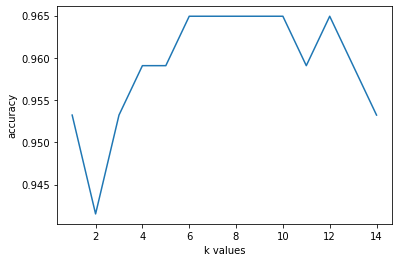

In [60]:
# Finding optimal  k value

score_list = []

for each in range(1,15):
    knn2 = KNeighborsClassifier(n_neighbors = each)
    knn2.fit(x_train,y_train)
    score_list.append(knn2.score(x_test,y_test))
    
plt.plot(range(1,15),score_list)
plt.xlabel("k values")
plt.ylabel("accuracy")
plt.show()

# Support Vector Machines¶

In [61]:
from sklearn.svm import SVC
 
svm = SVC(random_state = 1)
svm.fit(x_train,y_train)
 
print("accuracy of svm value is: ",svm.score(x_test,y_test))

pred_score.append(svm.score(x_test,y_test))

accuracy of svm value is:  0.9649122807017544


# Naive Bayes Classification

In [62]:
from sklearn.naive_bayes import GaussianNB
nb = GaussianNB()
nb.fit(x_train,y_train)
 
print("accuracy of naive bayes : ",nb.score(x_test,y_test))

pred_score.append(nb.score(x_test,y_test))

accuracy of naive bayes :  0.935672514619883


# Decision Tree

In [63]:
from sklearn.tree import DecisionTreeClassifier
dt = DecisionTreeClassifier()
dt.fit(x_train,y_train)

print("accuracy of decision tree: ", dt.score(x_test,y_test))

pred_score.append(dt.score(x_test,y_test))

accuracy of decision tree:  0.9473684210526315


# Random Forest

In [64]:
from sklearn.ensemble import RandomForestClassifier

n_estimators = 100  # as an example number of trees

rf = RandomForestClassifier(n_estimators = n_estimators,random_state = 1)

rf.fit(x_train,y_train)

print("accuracy of random forest (100): ",rf.score(x_test,y_test))

pred_score.append(rf.score(x_test,y_test))

accuracy of random forest (100):  0.9532163742690059


# Evaluating Confusion Matrix

In [65]:
y_pred = rf.predict(x_test)
y_true = y_test

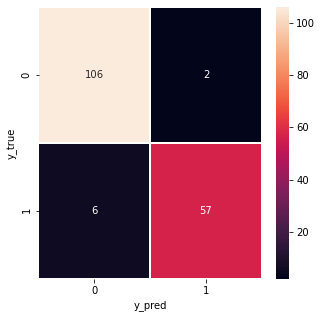

In [66]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_true,y_pred)

# visualization with heatmap
f, ax = plt.subplots(figsize =(5,5))
sns.heatmap(cm,annot = True,linewidths=0.5,fmt = ".0f",ax = ax)

plt.xlabel("y_pred")
plt.ylabel("y_true")
plt.show()